# Linear Factor Analysis
In this notebook we show how Linear Factor Anlaysis ( LFA ) learns representations by using maximum likelihood estimation. We demonstrate how to perform inference and sampling with the MNIST dataset. 
<img src="factorModel.PNG">
Image source: http://www.deeplearningbook.org/contents/linear_factors.html

In [220]:
from sklearn.decomposition import FactorAnalysis
from keras.datasets import mnist
import matplotlib.pyplot as plt
import numpy as np
from ipywidgets import interact
from IPython.display import HTML
from matplotlib import animation

### Loading MNIST and Training the Model

In [4]:
(x_train, y_train), (x_test, y_test) = mnist.load_data()

In [277]:
nComponnents = 100
fa = FactorAnalysis(nComponnents)

fa.fit(x_train.reshape(x_train.shape[0],28*28))

FactorAnalysis(copy=True, iterated_power=3, max_iter=1000, n_components=100,
        noise_variance_init=None, random_state=0, svd_method='randomized',
        tol=0.01)

### Visualizing the Learned Factors
Use the interactive slider to pan trough the learned factors. The image plot uses a gray color map, so the lighter the pixel is, the higher the value. 

In [278]:
def visFAComp(idx=0):
    plt.imshow(fa.components_[idx].reshape(28,28),cmap="gray")
    plt.show()

interact(visFAComp,idx=(0,fa.components_.shape[0]-1))

interactive(children=(IntSlider(value=0, description='idx', max=99), Output()), _dom_classes=('widget-interact',))

<function __main__.visFAComp>

Question: Why do I sometimes see a negative impression (all black pixes) of a digit?

Answer: We can think of this as a representation that rules out a particular digit class. If you want to learn the digit "6", you could do so if you have a representation that tells us a digit is not "5","4", etc. 

### Sampling from a FA
Given the learned representations (factors), how do we produce samples? 

In [147]:
factors = fa.components_

print("We have {0} factors, each of which have a weighted connection to {1} output units."
      .format(factors.shape[0],factors.shape[1]))

We have 50 factors, each of which have a weighted connection to 784 output units.


We start by simply taking the dot product of an identity vector and the factors. The output dimension of the dot product will be: (1,factors) dot (factors,nPixels) = (1,nPixels). This operation gives us a single image which can be seen as an aggrigation of all the features. 

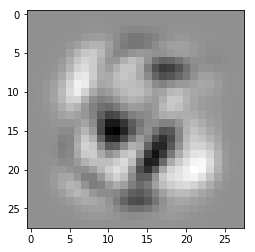

In [148]:
ident = np.ones((1,factors.shape[0]))
res = np.dot(ident,factors).reshape(28,28)
plt.imshow(res,cmap="gray")
plt.show()

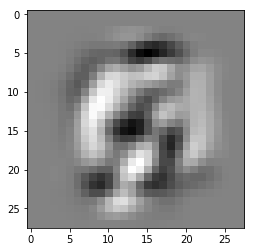

In [151]:
ident = np.random.normal(factors.mean(),factors.std(),(1,factors.shape[0]))
res = np.dot(ident,factors).reshape(28,28)
plt.imshow(res,cmap="gray")
plt.show()

### Performing Inference on a FA
Given a trained factor model and some partially observed pixel data, how do we use the model to infer the remainder of the pixels? In this section we will show how this is accomplished. 

Training image 10


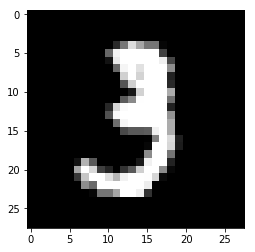

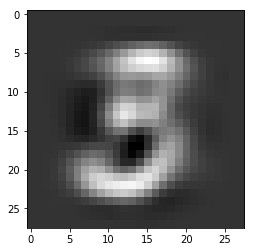

In [280]:
trainEx =10
res = np.dot(x_train[trainEx].reshape(1,28*28),fa.components_.T)
res2 = np.dot(res,fa.components_)

print("Training image {0}".format(trainEx))
plt.imshow(x_train[trainEx],cmap="gray")
plt.show()

plt.imshow(res2.reshape(28,28),cmap="gray")
plt.show()


In [216]:
def visInference(testEX=0,boundaryCut=400):
    fig, axes = plt.subplots(2, 1,figsize=(10,10))
    
    imTst = x_test[testEX].reshape(28*28)
    imTest = np.append(imTst[0:boundaryCut],np.zeros((28*28)-boundaryCut))

    axes[0].imshow(imTest.reshape(28,28),cmap="gray")

    res = np.dot(imTest.reshape(1,28*28),fa.components_.T)
    res2 = np.dot(res,fa.components_)
    axes[1].imshow(res2.reshape(28,28),cmap="gray")
    

    plt.show()

interact(visInference, testEX=(0,x_test.shape[0]-1),boundaryCut=(0,28*28))

interactive(children=(IntSlider(value=0, description='testEX', max=9999), IntSlider(value=400, description='boundaryCut', max=784), Output()), _dom_classes=('widget-interact',))

<function __main__.visInference>

Here we write a function to produce an animation of the inference process. If you run this code, it will take a long time to render and will take up quite a bit of memory. 

In [262]:
def animateInference(trainingIdx):
    
    imTst = x_test[trainingIdx].reshape(28*28)

    frames = []
    fig, axes = plt.subplots(2, 1,figsize=(10,10))
    for boundaryCut in range(28*28):
        
        # Erase 28*28 - boundaryCut pixels from the image. 
        imTest = np.append(imTst[0:boundaryCut],np.zeros((28*28)-boundaryCut))
        
        # Plot the partial image. 
        out1 = axes[0].imshow(imTest.reshape(28,28),cmap="gray")
        
        # 1. Encoding step. 
        # Multiply the partial image by the factor weights to get the latent values.
        # (1,28*28) dot (28*28,factors) = (1,factors)
        res = np.dot(imTest.reshape(1,28*28),fa.components_.T)
        
        # 2. Decoding step. 
        # Multiply the latent values by the factor weights to get the observed values. 
        # (1,factors) dot (factors,28*28) = (1,28*28)
        res2 = np.dot(res,fa.components_)
        
        # Plot the resulting image. 
        out2 = axes[1].imshow(res2.reshape(28,28),cmap="gray")
        
        frames.append([out1,out2])
        
    plt.close(fig)
    
    return animation.ArtistAnimation(fig,frames,interval=10, blit=True,repeat_delay=1000)

In [281]:
ani = animateInference(319)
HTML(ani.to_jshtml(default_mode="reflect"))


### Experiments to Try

1.) Experiment with the number of factors and how it changes the quality of the inference. 

## Scrap
Ignore this section. It contains some experiments that did not make it into the exposition. 

In [47]:
fa2 = FactorAnalysis(28*28)
fa2.fit(res)

FactorAnalysis(copy=True, iterated_power=3, max_iter=1000, n_components=784,
        noise_variance_init=None, random_state=0, svd_method='randomized',
        tol=0.01)

In [48]:
out = fa2.transform(res)

In [49]:
out.shape

(60000, 10)

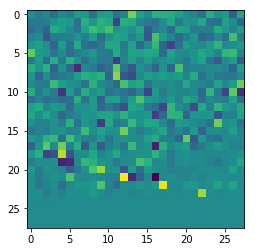

In [17]:
plt.imshow(res[0].reshape(28,28))
plt.show()

In [ ]:
res = fa.transform(x_train.reshape(x_train.shape[0],28*28))

In [18]:
res2 =  fa.transform(3)

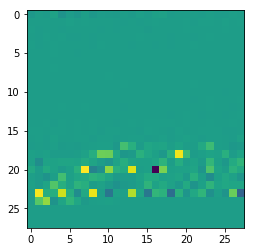

In [21]:
plt.imshow(res2[0].reshape(28,28))
plt.show()

In [34]:
fa.score_samples(res[0].reshape(1,28*28))

array([-2.18999708e+13])

In [ ]:
mean = fa.components_[0].mean()/7
firstComp = fa.components_[0] 
plt.imshow(res.reshape(28,28))
plt.show()

filterRes = firstComp*((firstComp > mean) | (firstComp < -mean))
plt.imshow(filterRes.reshape(28,28))
plt.show()

In [ ]:
means = list(map( lambda x: x.mean() , fa.components_ ))
stds  = list(map( lambda x: x.std() , fa.components_ ))

noise = np.random.normal(means,stds, (1, dim))
res = np.dot(noise,fa.components_)
plt.imshow(res[0].reshape(28,28))
plt.show()